In [1]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
from  datetime import datetime
from scipy import stats
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")
import ipywidgets as widgets


In [2]:
df = pd.read_csv("GlobalWeatherRepository.csv")

In [3]:
df.shape

(8376, 41)

In [4]:
#Check for null  values
df.isnull().sum()

country                         0
location_name                   0
latitude                        0
longitude                       0
timezone                        0
last_updated_epoch              0
last_updated                    0
temperature_celsius             0
temperature_fahrenheit          0
condition_text                  0
wind_mph                        0
wind_kph                        0
wind_degree                     0
wind_direction                  0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
precip_in                       0
humidity                        0
cloud                           0
feels_like_celsius              0
feels_like_fahrenheit           0
visibility_km                   0
visibility_miles                0
uv_index                        0
gust_mph                        0
gust_kph                        0
air_quality_Carbon_Monoxide     0
air_quality_Ozone               0
air_quality_Ni

In [5]:
# Check for duplicate values
duplicates = df.duplicated()
duplicates_count = duplicates.sum()
print("Number of duplicated rows: ", duplicates_count)

Number of duplicated rows:  0


In [6]:
#To know the unique value
df.nunique()

country                          185
location_name                    197
latitude                         193
longitude                        194
timezone                         183
last_updated_epoch                71
last_updated                    1333
temperature_celsius              358
temperature_fahrenheit           542
condition_text                    24
wind_mph                         113
wind_kph                         113
wind_degree                      360
wind_direction                    16
pressure_mb                       52
pressure_in                      126
precip_mm                        274
precip_in                         46
humidity                          96
cloud                             99
feels_like_celsius               523
feels_like_fahrenheit            845
visibility_km                     50
visibility_miles                  13
uv_index                          10
gust_mph                         367
gust_kph                         542
a

### Data Cleaning/ Processing

In [7]:
# 1. Date/Time Conversion
df['last_updated'] = pd.to_datetime(df['last_updated'])

In [8]:
# 2. Label Encoding
import pandas as pd

unique_conditions = df['condition_text'].unique()

condition_mapping = {condition: idx for idx, condition in enumerate(unique_conditions)}

df['condition_text'] = df['condition_text'].replace(condition_mapping)

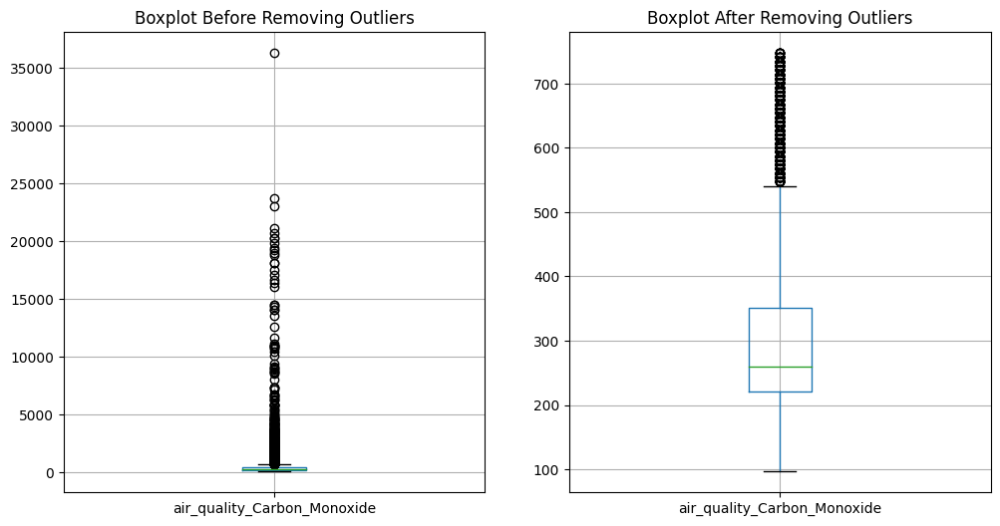

In [9]:
# 3. Outliers
Q1 = df['air_quality_Carbon_Monoxide'].quantile(0.25)
Q3 = df['air_quality_Carbon_Monoxide'].quantile(0.75)
IQR = Q3 - Q1


lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
df_no_outliers = df[(df['air_quality_Carbon_Monoxide'] >= lower_bound) & (df['air_quality_Carbon_Monoxide'] <= upper_bound)]


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
df.boxplot(column='air_quality_Carbon_Monoxide')
plt.title('Boxplot Before Removing Outliers')

plt.subplot(1, 2, 2)
df_no_outliers.boxplot(column='air_quality_Carbon_Monoxide')
plt.title('Boxplot After Removing Outliers')

plt.show()

In [10]:
# 4. Duplicate values
duplicates = df.duplicated()
duplicates_count = duplicates.sum()
print("Number of duplicated rows: ", duplicates_count)

Number of duplicated rows:  0


In [11]:
# 5 . Feature Selection
features = ['country',
 'location_name',
 'latitude',
 'longitude',
 'last_updated',
 'temperature_celsius',
 'condition_text',
 'wind_kph',
 'pressure_mb',
 'pressure_in',
 'precip_mm',
 'precip_in',
 'humidity',
 'cloud',
 'visibility_km',
 'uv_index',
 'gust_kph',
 'air_quality_Carbon_Monoxide',
 'air_quality_Ozone',
 'air_quality_Nitrogen_dioxide',
 'air_quality_Sulphur_dioxide',
 'air_quality_PM2.5',
 'air_quality_PM10',
 'air_quality_us-epa-index',
 'air_quality_gb-defra-index']
df1 = df[features]
df1


,country,location_name,latitude,longitude,last_updated,temperature_celsius,condition_text,wind_kph,pressure_mb,pressure_in,...,uv_index,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index
0,Afghanistan,Kabul,34.52,69.18,2023-08-29 14:00:00,28.8,0,11.5,1004.0,29.64,...,7.0,13.3,647.5,130.2,1.2,0.4,7.9,11.1,1,1
1,Albania,Tirana,41.33,19.82,2023-08-29 11:30:00,27.0,1,6.1,1006.0,29.71,...,6.0,11.9,433.9,104.4,3.6,1.8,28.2,29.6,2,3
2,Algeria,Algiers,36.76,3.05,2023-08-29 10:30:00,28.0,1,13.0,1014.0,29.94,...,7.0,5.4,647.5,16.6,63.1,12.6,6.4,7.9,1,1
3,Andorra,Andorra La Vella,42.50,1.52,2023-08-29 11:30:00,10.2,0,9.7,1015.0,29.97,...,4.0,11.9,190.3,68.0,0.2,0.2,0.5,0.8,1,1
4,Angola,Luanda,-8.84,13.23,2023-08-29 10:30:00,25.0,1,3.6,1016.0,30.00,...,6.0,5.8,2136.2,147.3,52.8,26.9,139.6,203.3,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8371,Venezuela,Caracas,10.50,-66.92,2023-10-09 17:15:00,31.0,0,19.1,1010.0,29.83,...,5.0,7.0,330.5,80.1,19.9,41.0,9.4,10.6,1,1
8372,Vietnam,Hanoi,21.03,105.85,2023-10-10 04:15:00,25.0,3,6.1,1015.0,29.97,...,1.0,20.3,500.7,47.9,10.1,5.1,37.3,44.2,2,4
8373,Yemen,Sanaa,15.35,44.21,2023-10-10 00:15:00,15.8,3,10.8,1018.0,30.06,...,1.0,18.8,151.9,83.7,2.7,7.5,22.2,74.2,2,2
8374,Zambia,Lusaka,-15.42,28.28,2023-10-09 23:15:00,25.5,3,16.6,1012.0,29.88,...,1.0,26.5,881.2,55.1,4.1,4.3,12.8,18.5,1,2


In [12]:
df1.columns

Index(['country', 'location_name', 'latitude', 'longitude', 'last_updated',
       'temperature_celsius', 'condition_text', 'wind_kph', 'pressure_mb',
       'pressure_in', 'precip_mm', 'precip_in', 'humidity', 'cloud',
       'visibility_km', 'uv_index', 'gust_kph', 'air_quality_Carbon_Monoxide',
       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
       'air_quality_us-epa-index', 'air_quality_gb-defra-index'],
      dtype='object')

In [13]:
# 6. Missing Values
missing_values = df1.isnull().sum()

print(missing_values)

country                         0
location_name                   0
latitude                        0
longitude                       0
last_updated                    0
temperature_celsius             0
condition_text                  0
wind_kph                        0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
precip_in                       0
humidity                        0
cloud                           0
visibility_km                   0
uv_index                        0
gust_kph                        0
air_quality_Carbon_Monoxide     0
air_quality_Ozone               0
air_quality_Nitrogen_dioxide    0
air_quality_Sulphur_dioxide     0
air_quality_PM2.5               0
air_quality_PM10                0
air_quality_us-epa-index        0
air_quality_gb-defra-index      0
dtype: int64


In [14]:
# 7. DataType
datatype = df1.dtypes
print(datatype)

country                                 object
location_name                           object
latitude                               float64
longitude                              float64
last_updated                    datetime64[ns]
temperature_celsius                    float64
condition_text                           int64
wind_kph                               float64
pressure_mb                            float64
pressure_in                            float64
precip_mm                              float64
precip_in                              float64
humidity                                 int64
cloud                                    int64
visibility_km                          float64
uv_index                               float64
gust_kph                               float64
air_quality_Carbon_Monoxide            float64
air_quality_Ozone                      float64
air_quality_Nitrogen_dioxide           float64
air_quality_Sulphur_dioxide            float64
air_quality_P

In [15]:
# 8. Apply log transformation to skewed numerical columns
df1['humidity'] = np.log1p(df1['humidity'])

In [16]:
# 9. Convert float values to integers in 'uv_index'
df['uv_index'] = df['uv_index'].astype(int)

## Exploratory Data Analysis (EDA)

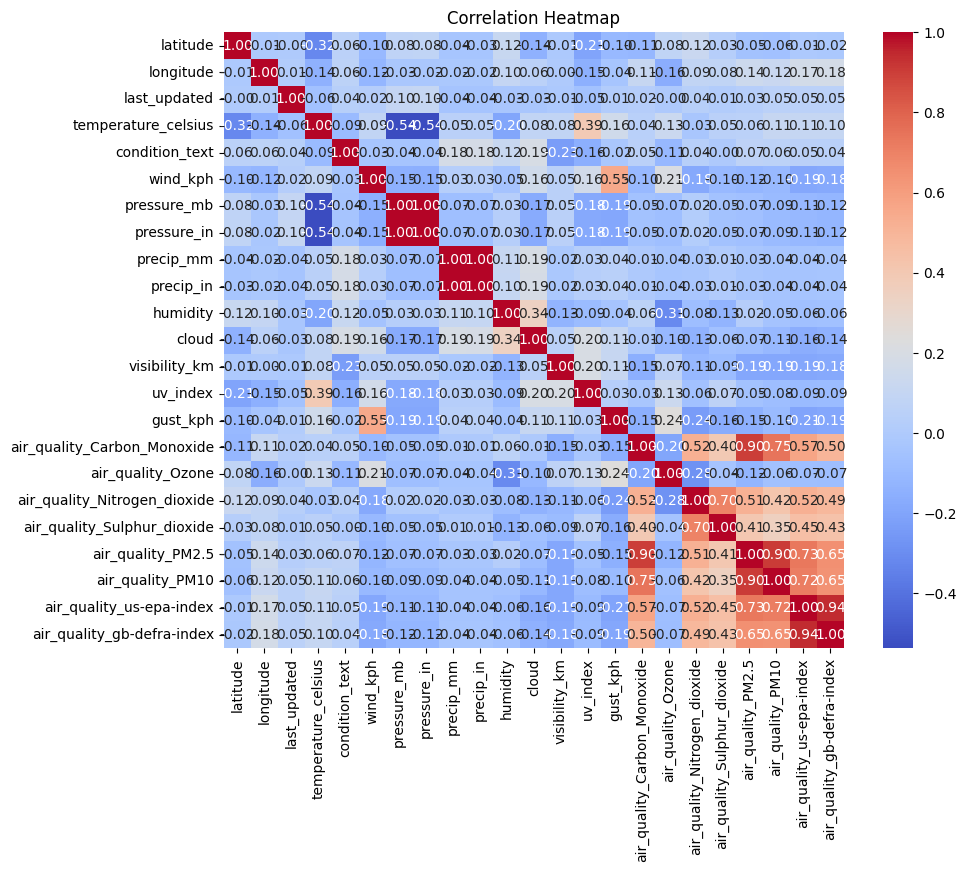

In [17]:
# 1. Correlation
textcor = ['country', 'location_name']
dfc = df1.drop(columns=textcor, axis=1)

correlation_matrix = dfc.corr()
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

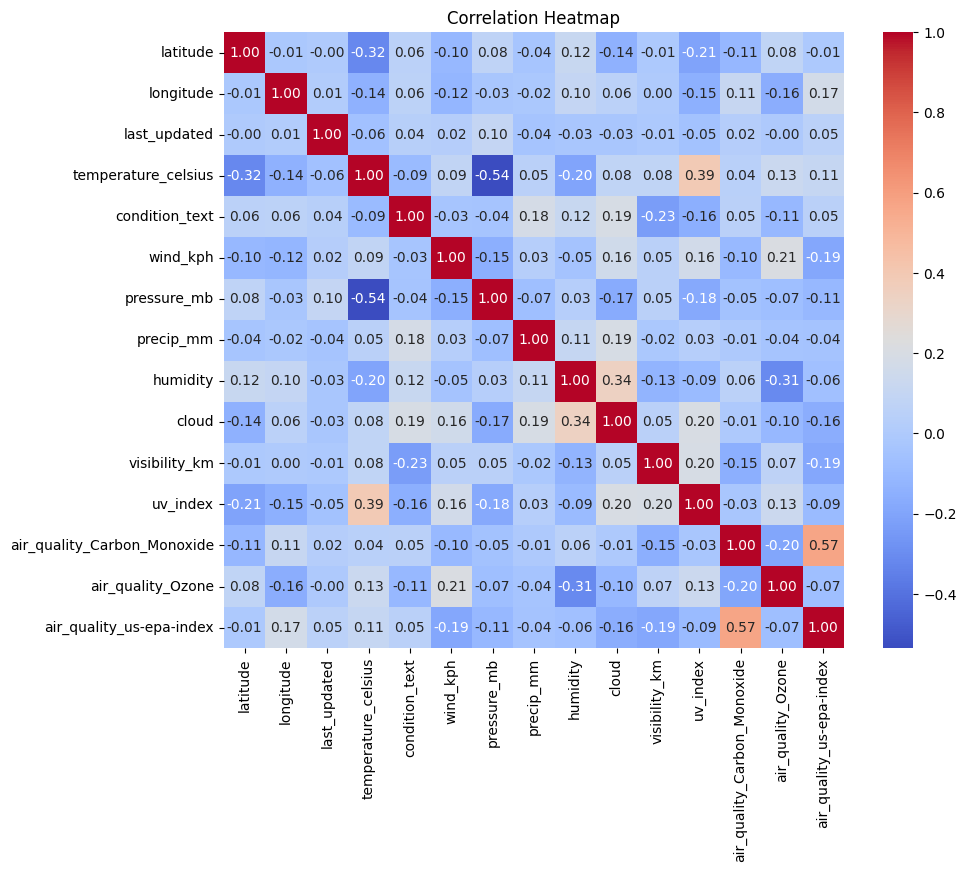

In [18]:
dd=['pressure_in','precip_in','air_quality_gb-defra-index','air_quality_PM2.5',
    'air_quality_PM10','air_quality_Sulphur_dioxide','gust_kph','air_quality_Nitrogen_dioxide']
dfc1=dfc.drop(columns=dd)
#dfc1
correlation_matrix = dfc1.corr()
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [19]:
dd=['pressure_in','precip_in','air_quality_gb-defra-index','air_quality_PM2.5',
    'air_quality_PM10','air_quality_Sulphur_dioxide','gust_kph','air_quality_Nitrogen_dioxide']
df2=df1.drop(columns=dd)


In [20]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df2[[	 'latitude',	'longitude',	'temperature_celsius',	
         'pressure_mb',	'precip_mm',	'humidity',	'cloud',	
         'visibility_km',	'uv_index',	'air_quality_Ozone',	
         	]]  
# Include all the features for which you want to calculate VIF

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF values
print(vif_data)

              Variable         VIF
0             latitude    1.912150
1            longitude    1.180014
2  temperature_celsius   14.633184
3          pressure_mb  219.747747
4            precip_mm    1.082238
5             humidity  171.908080
6                cloud    2.597864
7        visibility_km   17.312025
8             uv_index    2.597627
9    air_quality_Ozone    3.087104


In [21]:
# 2. Multi-collinearity
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df1[[	'latitude',	'longitude',	'temperature_celsius',	'pressure_mb',	'precip_mm',	'humidity',	'cloud',	'visibility_km',	'uv_index',	'air_quality_Ozone',	'air_quality_Nitrogen_dioxide',	'air_quality_PM10'
]]  # Include all the features for which you want to calculate VIF

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF values
print(vif_data)

                        Variable         VIF
0                       latitude    1.995500
1                      longitude    1.203673
2            temperature_celsius   15.033144
3                    pressure_mb  232.271841
4                      precip_mm    1.083156
5                       humidity  177.317023
6                          cloud    2.627363
7                  visibility_km   17.990028
8                       uv_index    2.621717
9              air_quality_Ozone    3.511709
10  air_quality_Nitrogen_dioxide    1.890771
11              air_quality_PM10    1.545512


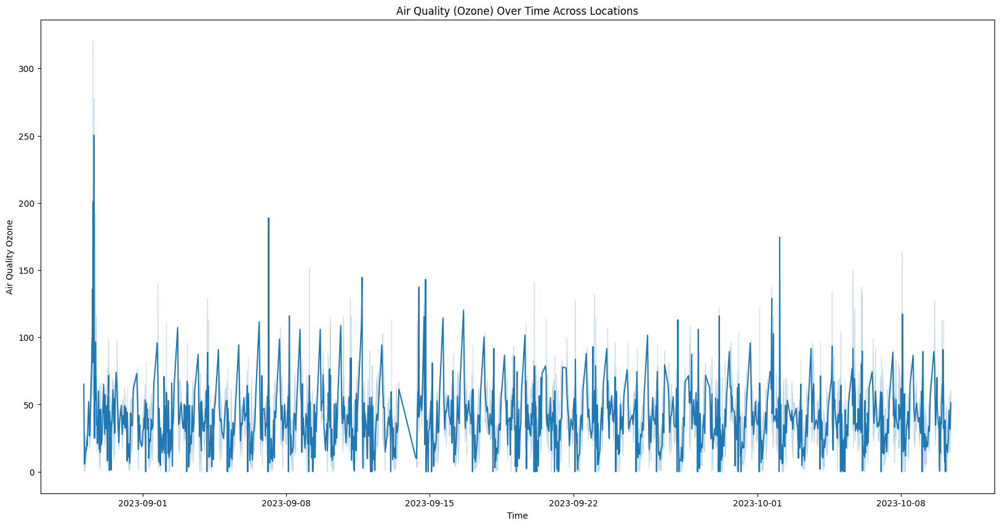

In [22]:
# 3. Air_quality_Ozone over the years
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))  
sns.lineplot(x='last_updated', y='air_quality_Ozone', data=df1)
plt.title('Air Quality (Ozone) Over Time Across Locations')
plt.xlabel('Time')
plt.ylabel('Air Quality Ozone')
plt.show()

In [23]:
# 4. Map showing the air_quality_PM10 for different regions.
#Those with higher values are marked in red, whereas lower values marked in yellow.


import folium
from folium.plugins import MarkerCluster

map_center = [df1['latitude'].mean(), df['longitude'].mean()]
my_map = folium.Map(location=map_center, zoom_start=2)

marker_cluster = MarkerCluster().add_to(my_map)

for idx, row in df1.iterrows():
    if row['air_quality_PM10'] > 50:
        color = 'red'  # Higher air quality
    else:
        color = 'yellow'  # Lower air quality

    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=f"Air Quality_PM10: {row['air_quality_PM10']}",
                  icon=folium.Icon(color=color)).add_to(marker_cluster)

my_map

<Axes: xlabel='temperature_celsius', ylabel='Density'>

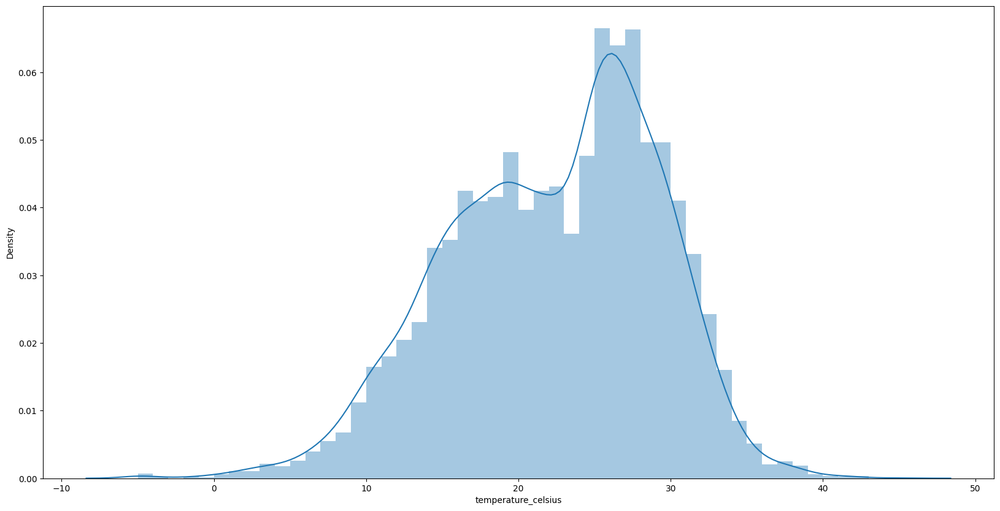

In [24]:
# 5. Temperature over the density
plt.figure(figsize=(20,10))
sns.distplot(df1['temperature_celsius'])

Text(0.5, 0, 'air_quality_Ozone')

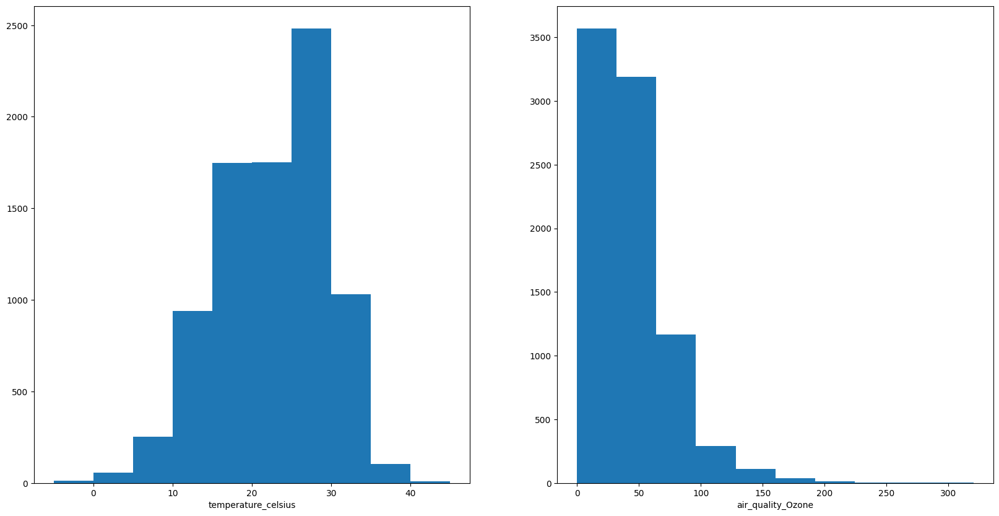

In [25]:
# 6. Histogram
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.hist(df['temperature_celsius'])
plt.xlabel('temperature_celsius')
plt.subplot(1,2,2)
plt.hist(df['air_quality_Ozone'])
plt.xlabel('air_quality_Ozone')

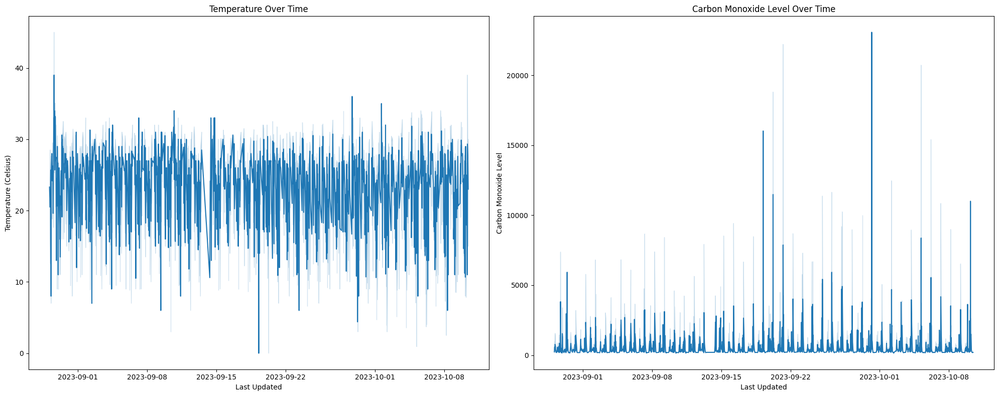

In [26]:
# 7. Tempearature over time and carbon monoxide
plt.figure(figsize=(20, 8))
# First subplot
plt.subplot(1, 2, 1)
sns.lineplot(x='last_updated', y='temperature_celsius', data=df)
plt.xlabel('Last Updated')
plt.ylabel('Temperature (Celsius)')
plt.title('Temperature Over Time')
# Second subplot
plt.subplot(1, 2, 2)
sns.lineplot(x='last_updated', y='air_quality_Carbon_Monoxide', data=df)
plt.xlabel('Last Updated')
plt.ylabel('Carbon Monoxide Level')
plt.title('Carbon Monoxide Level Over Time')
plt.tight_layout()
plt.show()

In [27]:
# 8. Humidity in different locations
import folium
from folium.plugins import HeatMap
m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=3)
heat_data = [[row['latitude'], row['longitude'], row['humidity']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(m)
m

In [28]:
# 9. Temperature Wind speed
fig = px.scatter(df, x='temperature_celsius', y='wind_kph', title='Temperature vs Wind Speed')
fig.update_xaxes(title='Temperature (°C)')
fig.update_yaxes(title='Wind Speed (kph)')
fig.show()

In [29]:
# 10. Air quality by country
fig = px.bar(df, x='country', y='air_quality_us-epa-index',
             title='Air Quality by Country')
fig.update_xaxes(title='Country')
fig.update_yaxes(title='Air Quality (US EPA Index)')
fig.show()

# Phase 2

### Linear Regression

Mean Squared Error: 23.532157275388734
Root Mean Squared Error: 4.850995493235253
Coefficients: [-6.57006805e-02 -1.37236881e-02 -7.99566604e-02 -5.99216584e-02
 -5.36314618e-01  2.31594090e-01 -1.73408614e+00 -1.39813770e-03
  1.49419115e-01  7.05007759e-01 -2.34794319e-04  9.40872217e-03
  9.40579142e-01]
Intercept: 570.9953530328667


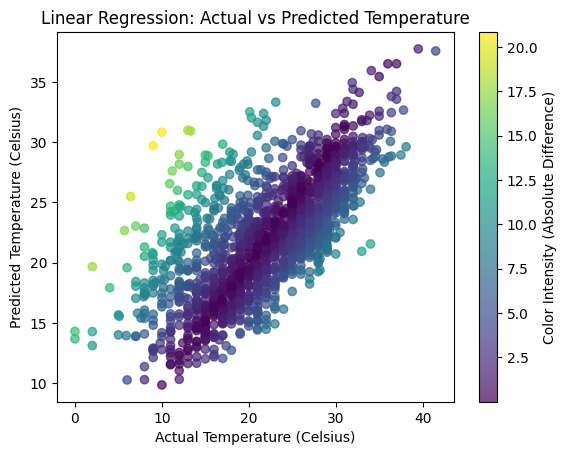

In [30]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

features = df2[[
 'latitude',
 'longitude',
 'condition_text',
 'wind_kph',
 'pressure_mb',
 'precip_mm',
 'humidity',
 'cloud',
 'visibility_km',
 'uv_index',
 'air_quality_Carbon_Monoxide',
 'air_quality_Ozone',
 'air_quality_us-epa-index']]
target = df2['temperature_celsius']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)
predictions = model.predict(X_test)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)

colors = np.abs(y_test - predictions)

plt.scatter(y_test, predictions, c=colors, cmap='viridis', alpha=0.7)
plt.xlabel('Actual Temperature (Celsius)')
plt.ylabel('Predicted Temperature (Celsius)')
plt.title('Linear Regression: Actual vs Predicted Temperature')
plt.colorbar(label='Color Intensity (Absolute Difference)')
plt.show()

### KNN Regression

Mean Squared Error (MSE): 7.77
Root Mean Squared Error (RMSE): 2.79
R-squared (R2): 0.82


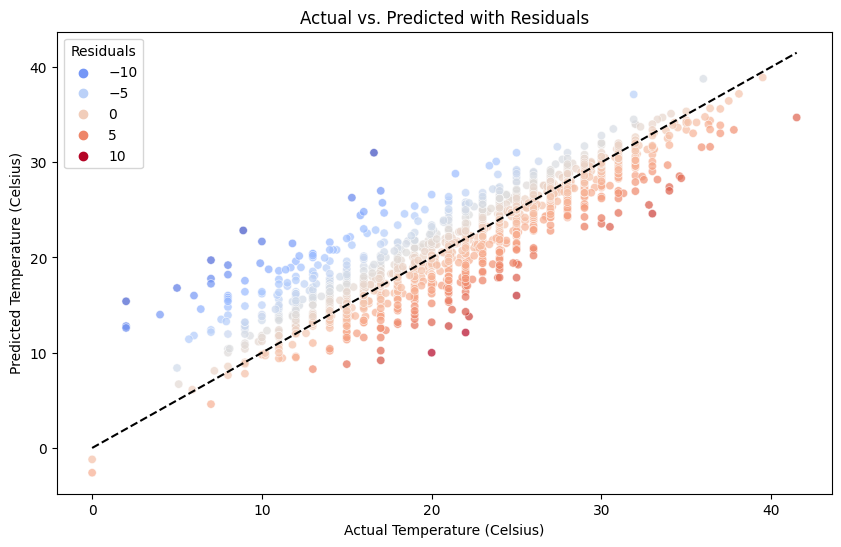

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

features = df2[[
 'latitude',
 'longitude',
 'condition_text',
 'wind_kph',
 'pressure_mb',
 'precip_mm',
 'humidity',
 'cloud',
 'visibility_km',
 'uv_index',
 'air_quality_Carbon_Monoxide',
 'air_quality_Ozone',
 'air_quality_us-epa-index']]
target = df2["temperature_celsius"]
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std= scaler.transform(X_test)
k = 5 
knn_regressor = KNeighborsRegressor(n_neighbors=k)
knn_regressor.fit(X_train_std, y_train)
y_pred = knn_regressor.predict(X_test_std)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
residuals= y_test - y_pred
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred, 'Residuals': residuals})

# Scatter plot with color-coded residuals
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted', hue='Residuals', data=results, palette='coolwarm', alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')  
plt.title('Actual vs. Predicted with Residuals')
plt.xlabel('Actual Temperature (Celsius)')
plt.ylabel('Predicted Temperature (Celsius)')
plt.legend(title='Residuals')
plt.show()

### KNN Classification

Accuracy (Standardized): 0.8031026252983293
Classification Report (Standardized):
              precision    recall  f1-score   support

           0       0.71      0.72      0.72        69
           1       0.74      0.91      0.82       651
           2       0.18      0.06      0.09        35
           3       0.92      0.95      0.94       640
           4       0.67      0.29      0.40         7
           5       0.60      0.46      0.53        56
           6       0.40      0.11      0.17        18
           7       0.78      0.34      0.48        61
           8       0.77      0.58      0.66        52
           9       0.55      0.24      0.33        25
          10       0.00      0.00      0.00        10
          11       0.00      0.00      0.00         1
          12       0.00      0.00      0.00        29
          13       0.67      0.15      0.25        13
          14       0.50      0.50      0.50         4
          15       0.00      0.00      0.00         2

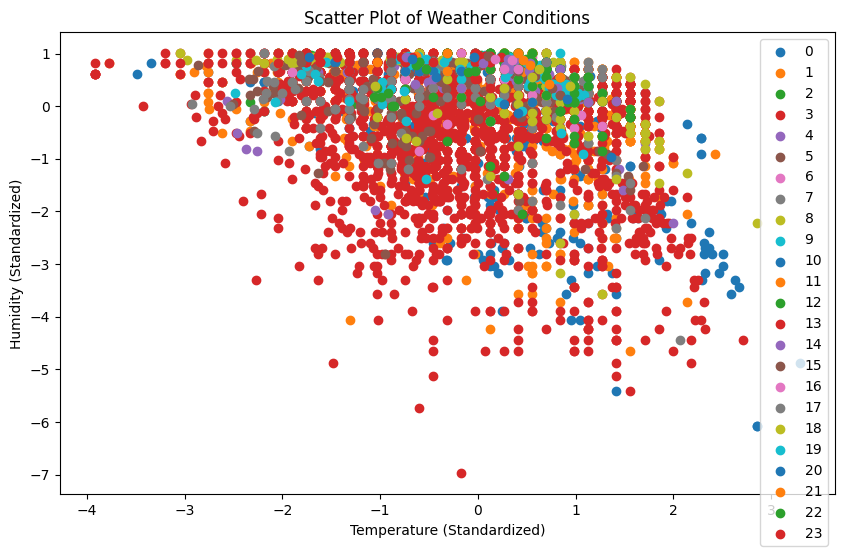

In [32]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, roc_auc_score
from matplotlib.colors import ListedColormap

features = df2[[
    'latitude',
    'longitude',
    'wind_kph',
    'temperature_celsius',
    'pressure_mb',
    'precip_mm',
    'humidity',
    'cloud',
    'visibility_km',
    'uv_index',
    'air_quality_Carbon_Monoxide',
    'air_quality_Ozone',
    'air_quality_us-epa-index']]
target = df2['condition_text']


X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

knn_model = KNeighborsClassifier(n_neighbors=10)
knn_model.fit(X_train_scaled, y_train)
predictions_scaled = knn_model.predict(X_test_scaled)


accuracy_scaled = accuracy_score(y_test, predictions_scaled)
conf_matrix_scaled = confusion_matrix(y_test, predictions_scaled)
class_report_scaled = classification_report(y_test, predictions_scaled)

print(f'Accuracy (Standardized): {accuracy_scaled}')
#print('Confusion Matrix (Standardized):')
#print(conf_matrix_scaled)
print('Classification Report (Standardized):')
print(class_report_scaled)

plt.figure(figsize=(10, 6))
for condition in np.unique(y_train):
    idx = np.where(y_train == condition)
    plt.scatter(X_train_scaled[idx, 3], X_train_scaled[idx, 6], label=condition)

plt.xlabel('Temperature (Standardized)')
plt.ylabel('Humidity (Standardized)')
plt.title('Scatter Plot of Weather Conditions')
plt.legend()
plt.show()

### Decision Tree Classification

Accuracy (Classification): 0.8430787589498807


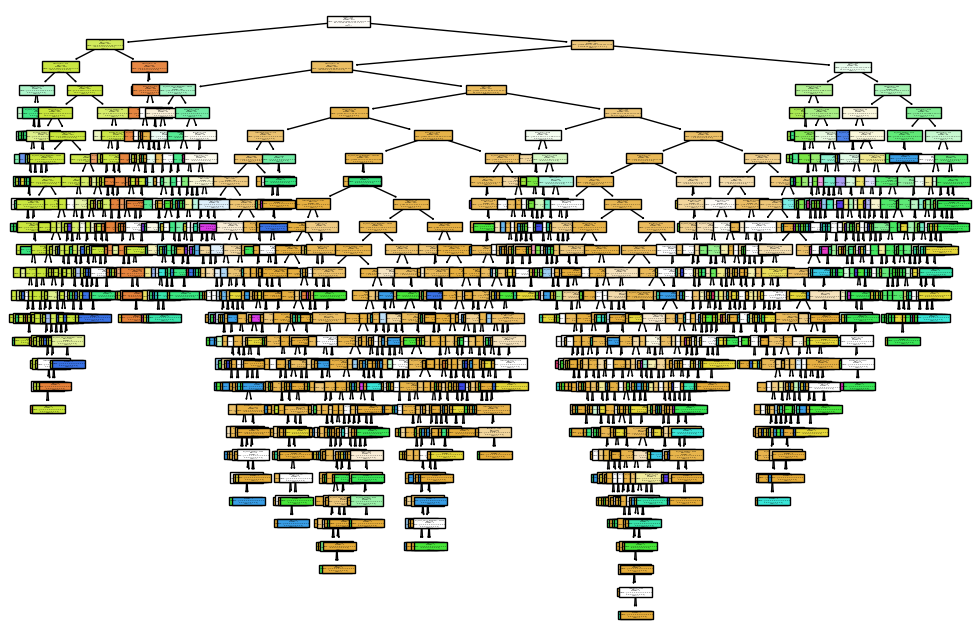

In [33]:

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import accuracy_score, classification_report, mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

features_classification = df2[[
    'latitude',
    'longitude',
    'wind_kph',
    'temperature_celsius',
    'pressure_mb',
    'precip_mm',
    'humidity',
    'cloud',
    'visibility_km',
    'uv_index',
    'air_quality_Carbon_Monoxide',
    'air_quality_Ozone',
    'air_quality_us-epa-index']]
target_classification = df2['condition_text']

X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(
    features_classification, target_classification, test_size=0.2, random_state=42)

dtree_class_model = DecisionTreeClassifier()
dtree_class_model.fit(X_train_class, y_train_class)
predictions_class = dtree_class_model.predict(X_test_class)

accuracy_class = accuracy_score(y_test_class, predictions_class)

print(f'Accuracy (Classification): {accuracy_class}')
#print('Classification Report (Classification):')
#print(class_report_class)

class_names = df2['condition_text'].unique().astype(str)
plt.figure(figsize=(12, 8))
plot_tree(dtree_class_model, filled=True, feature_names=features_classification.columns, class_names=class_names)
plt.show()


### Decision Tree Regression

Mean Squared Error (Regression): 7.2799880668257755
R-squared (Regression): 0.8332594413646983


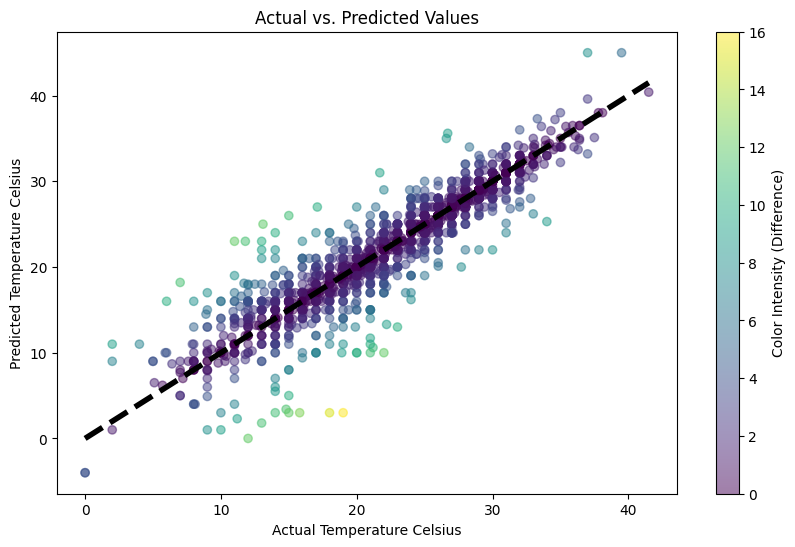

In [34]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

features_regression = df2[[
    'latitude',
    'longitude',
    'condition_text',
    'wind_kph',
    'pressure_mb',
    'precip_mm',
    'humidity',
    'cloud',
    'visibility_km',
    'uv_index',
    'air_quality_Carbon_Monoxide',
    'air_quality_Ozone',
    'air_quality_us-epa-index']]
target_regression = df2['temperature_celsius']

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    features_regression, target_regression, test_size=0.2, random_state=42)

dtree_reg_model = DecisionTreeRegressor()
dtree_reg_model.fit(X_train_reg, y_train_reg)
predictions_reg = dtree_reg_model.predict(X_test_reg)

mse_reg = mean_squared_error(y_test_reg, predictions_reg)
r2_reg = r2_score(y_test_reg, predictions_reg)

print(f'Mean Squared Error (Regression): {mse_reg}')
print(f'R-squared (Regression): {r2_reg}')

colors = np.abs(y_test_reg - predictions_reg)

plt.figure(figsize=(10, 6))
plt.scatter(y_test_reg, predictions_reg, c=colors, cmap='viridis', alpha=0.5)
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Temperature Celsius')
plt.ylabel('Predicted Temperature Celsius')
plt.colorbar(label='Color Intensity (Difference)')
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'k--', lw=4)
plt.show()


### Random Forest Classification

Accuracy (Random Forest Classification): 0.899164677804296
Classification Report (Random Forest Classification):
              precision    recall  f1-score   support

           0       0.88      0.99      0.93        69
           1       0.85      1.00      0.92       651
           2       0.33      0.17      0.23        35
           3       0.99      0.99      0.99       640
           4       1.00      0.29      0.44         7
           5       0.92      0.84      0.88        56
           6       0.33      0.06      0.10        18
           7       0.89      0.67      0.77        61
           8       0.87      0.75      0.80        52
           9       0.93      0.52      0.67        25
          10       0.50      0.10      0.17        10
          11       0.00      0.00      0.00         1
          12       0.40      0.07      0.12        29
          13       0.80      0.31      0.44        13
          14       0.67      0.50      0.57         4
          15       0.0

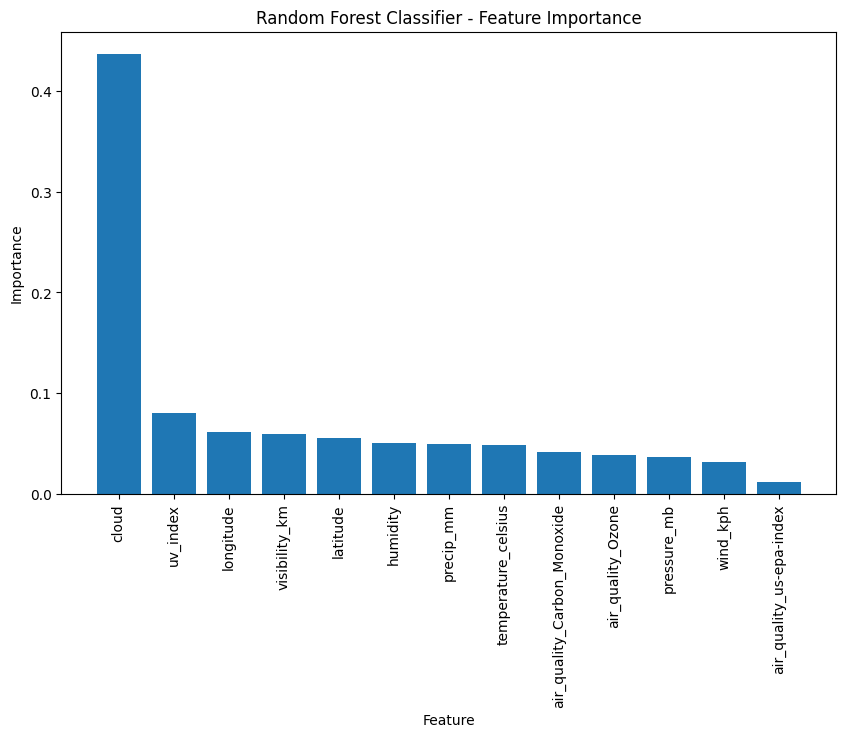

In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt

features_classification = df2[[
    'latitude',
    'longitude',
    'wind_kph',
    'temperature_celsius',
    'pressure_mb',
    'precip_mm',
    'humidity',
    'cloud',
    'visibility_km',
    'uv_index',
    'air_quality_Carbon_Monoxide',
    'air_quality_Ozone',
    'air_quality_us-epa-index']]
target_classification = df2['condition_text']

X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(
    features_classification, target_classification, test_size=0.2, random_state=42)

rf_class_model = RandomForestClassifier(n_estimators=100)  
rf_class_model.fit(X_train_class, y_train_class)

predictions_class = rf_class_model.predict(X_test_class)

accuracy_class = accuracy_score(y_test_class, predictions_class)
class_report_class = classification_report(y_test_class, predictions_class)

print(f'Accuracy (Random Forest Classification): {accuracy_class}')
print('Classification Report (Random Forest Classification):')
print(class_report_class)

feature_importance = rf_class_model.feature_importances_
feature_names = features_classification.columns

indices = np.argsort(feature_importance)[::-1]

plt.figure(figsize=(10, 6))
plt.bar(range(features_classification.shape[1]), feature_importance[indices])
plt.xticks(range(features_classification.shape[1]), feature_names[indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Random Forest Classifier - Feature Importance')
plt.show()


### Random Forest Regression

Mean Squared Error (Random Forest Regression): 3.7681150596658717
R-squared (Random Forest Regression): 0.9136952417664153


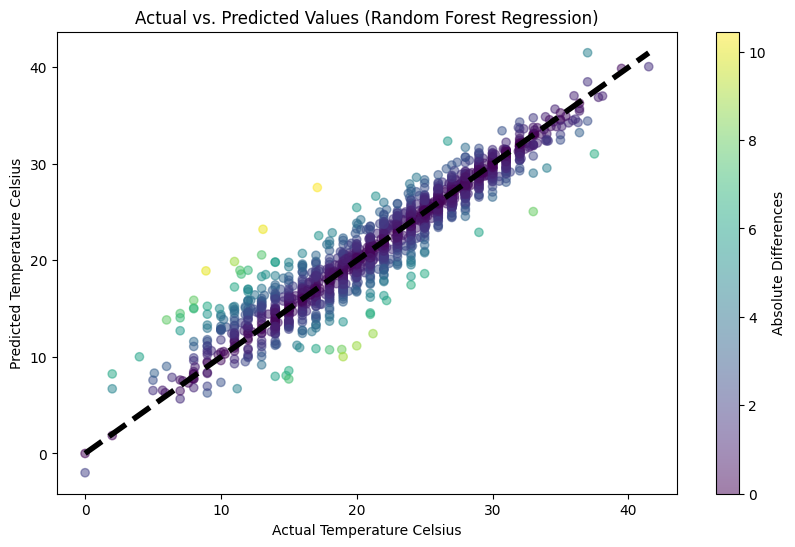

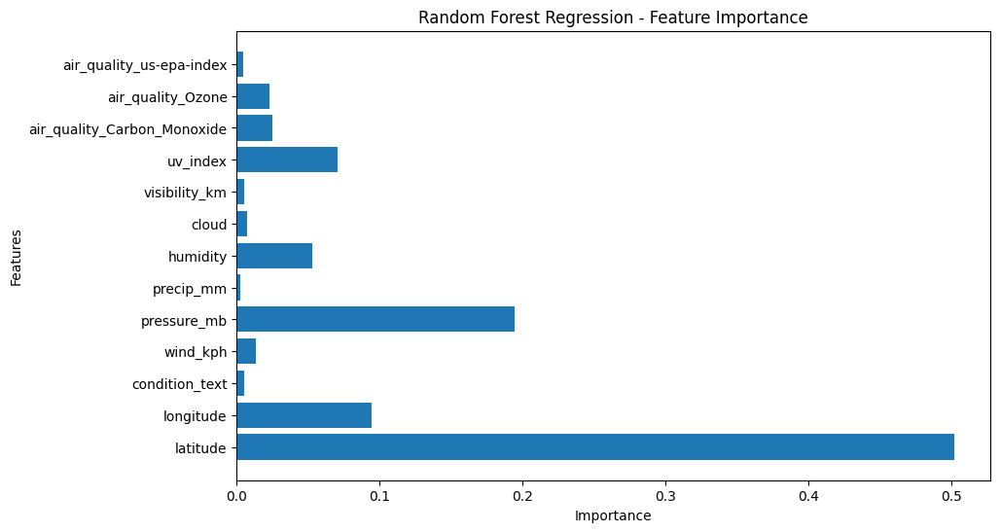

In [36]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
features_regression = df2[[
 'latitude',
 'longitude',
 'condition_text',
 'wind_kph',
 'pressure_mb',
 'precip_mm',
 'humidity',
 'cloud',
 'visibility_km',
 'uv_index',
 'air_quality_Carbon_Monoxide',
 'air_quality_Ozone',
 'air_quality_us-epa-index']]
target_regression = df2['temperature_celsius']  

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    features_regression, target_regression, test_size=0.2, random_state=42)

rf_reg_model = RandomForestRegressor(n_estimators=100)  
rf_reg_model.fit(X_train_reg, y_train_reg)
predictions_reg = rf_reg_model.predict(X_test_reg)

mse_reg = mean_squared_error(y_test_reg, predictions_reg)
r2_reg = r2_score(y_test_reg, predictions_reg)

print(f'Mean Squared Error (Random Forest Regression): {mse_reg}')
print(f'R-squared (Random Forest Regression): {r2_reg}')

abs_differences = np.abs(y_test_reg - predictions_reg)

plt.figure(figsize=(10, 6))
plt.scatter(y_test_reg, predictions_reg,c=abs_differences, cmap='viridis', alpha=0.5)
plt.title('Actual vs. Predicted Values (Random Forest Regression)')
plt.xlabel('Actual Temperature Celsius')
plt.ylabel('Predicted Temperature Celsius')
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'k--', lw=4)
plt.colorbar(label='Absolute Differences')
plt.show()

feature_importance = rf_reg_model.feature_importances_
feature_names = features_regression.columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, feature_importance)
plt.title('Random Forest Regression - Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

### K Means

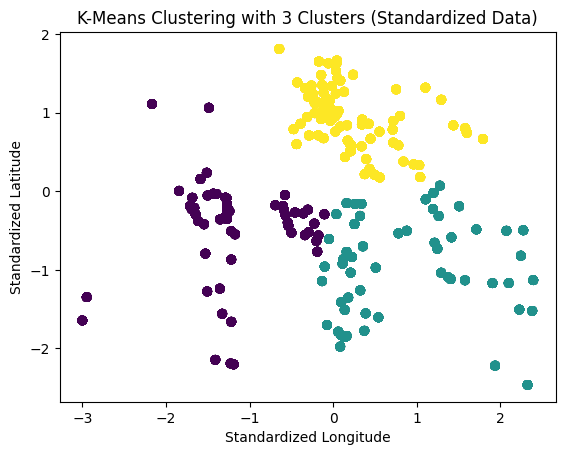

Inertia (Sum of Squared Distances within Clusters): 5838.97


In [37]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
X = df2[['latitude', 'longitude']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(X_scaled)
cluster_labels = kmeans.labels_
plt.scatter(X_scaled[:, 1], X_scaled[:, 0], c=cluster_labels, cmap='viridis')
plt.title(f'K-Means Clustering with {num_clusters} Clusters (Standardized Data)')
plt.xlabel('Standardized Longitude')
plt.ylabel('Standardized Latitude')
plt.show()
inertia = kmeans.inertia_
print(f"Inertia (Sum of Squared Distances within Clusters): {inertia:.2f}")

### Temperature Forecasting Using ARIMA Model 

Test RMSE: 0.6758883918052054
Test MAE: 0.4866720747234111


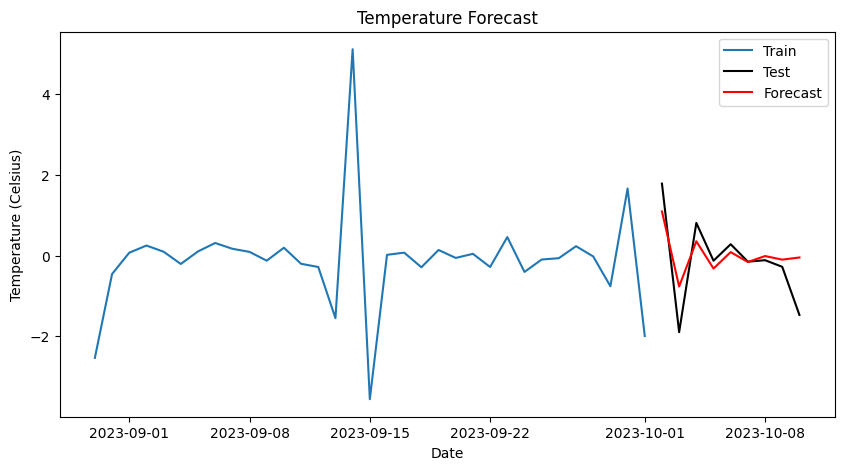

"forecast = model_fit.forecast(steps=len(test))\n\n# Combine forecast dates with predicted temperatures\nforecast_dates = test.index\nforecast_df = pd.DataFrame({'Date': forecast_dates, 'Predicted Temperature': forecast})\nprint(forecast_df)"

In [38]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt

# Load the dataset
data = pd.read_csv('GlobalWeatherRepository.csv')

# Convert 'last_updated' to datetime and set as index
data['last_updated'] = pd.to_datetime(data['last_updated'])
data.set_index('last_updated', inplace=True)

# Resample the data to a daily frequency, taking the mean for each day
daily_temperature = data['temperature_celsius'].resample('D').mean()

# Drop any NaN values that could have been introduced by resampling
daily_temperature.dropna(inplace=True)

# Perform a Dickey-Fuller test to check for stationarity
adf_result = adfuller(daily_temperature)

# If the p-value is greater than 0.05, we'll difference the data to make it stationary
if adf_result[1] > 0.05:
    daily_temperature = daily_temperature.diff().dropna()

# Define the training dataset and test dataset
# Using the last 30 days as the test set
train_size = int(len(daily_temperature) * 0.8)  # Use 80% of data for training
train, test = daily_temperature[0:train_size], daily_temperature[train_size:]

# Fit the ARIMA model on the training dataset
model = ARIMA(train, order=(1, 1, 1))
model_fit = model.fit()

# Forecast the next X days, where X is the size of the test set
forecast = model_fit.forecast(steps=len(test))

# Calculate the RMSE using the test set
rmse = sqrt(mean_squared_error(test, forecast))
print('Test RMSE:', rmse)

mae = mean_absolute_error(test, forecast)
print('Test MAE:', mae)

# Plotting the forecast against the actual values
plt.figure(figsize=(10, 5))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test', color='black')
plt.plot(test.index, forecast, label='Forecast', color='red')
plt.title('Temperature Forecast')
plt.xlabel('Date')
plt.ylabel('Temperature (Celsius)')
plt.legend()
plt.show()


'''forecast = model_fit.forecast(steps=len(test))

# Combine forecast dates with predicted temperatures
forecast_dates = test.index
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Predicted Temperature': forecast})
print(forecast_df)'''

### Air Quality Index Prediction Using SVM

The accuracy of the SVM model on the test set is: 0.69


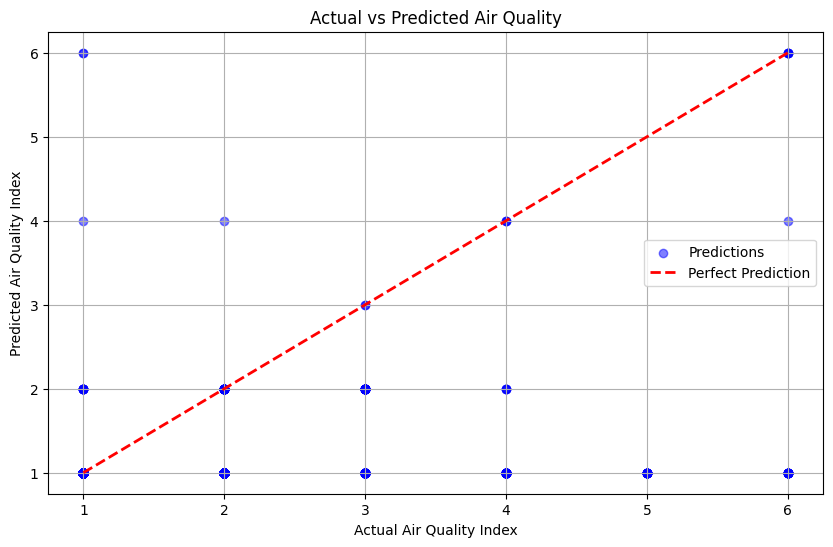

      Actual Air Quality Index  Predicted Air Quality Index
4988                         2                            1
8163                         1                            1
2333                         1                            1
4205                         1                            1
5405                         1                            1
...                        ...                          ...
5257                         3                            1
1129                         1                            1
7606                         1                            1
4717                         1                            1
5715                         1                            1

[1676 rows x 2 columns]


In [39]:
from sklearn import svm
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

df2 = pd.read_csv('GlobalWeatherRepository.csv')
'''df2['last_updated'] = pd.to_datetime(df2['last_updated']).astype('int64')
df2.set_index('last_updated', inplace=True)'''


features = [
    'temperature_celsius', 
    'humidity', 
    'wind_kph', 
    'pressure_mb', 
    'precip_mm', 
    'cloud', 
    'visibility_km', 
    'uv_index', 
]



# Check for missing values in the features
missing_data = df2[features].isnull().sum()
missing_data = missing_data[missing_data > 0]

# If there are missing values, we will need to handle them, 
# either by imputation or by removing the rows/columns
if not missing_data.empty:
    # Simple imputation with the mean (other strategies could be used as well)
    for feature in missing_data.index:
        df2[feature].fillna(df2[feature].mean(), inplace=True)

# Now let's prepare the data for training
X = df2[features]  # Features
y = df2['air_quality_us-epa-index']  

# Split the data into a training set and a testing set (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the SVM classifier with default parameters
# Here we use SVC (Support Vector Classification)
classifier = svm.SVC()

# Train the SVM classifier
classifier.fit(X_train, y_train)

# Predict the labels on the test set
y_pred = classifier.predict(X_test)

# Evaluate the SVM model
accuracy = accuracy_score(y_test, y_pred)

# Print out the accuracy
print(f'The accuracy of the SVM model on the test set is: {accuracy:.2f}')


'''test_dates = pd.to_datetime(X_test[:, features.index('last_updated')])
predicted_aqi_df = pd.DataFrame({'Date': test_dates, 'Predicted Air Quality Index': y_pred})
print(predicted_aqi_df)
'''


plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5, label='Predictions')
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--', lw=2, label='Perfect Prediction')
plt.title('Actual vs Predicted Air Quality')
plt.xlabel('Actual Air Quality Index')
plt.ylabel('Predicted Air Quality Index')
plt.legend()
plt.grid(True)
plt.show()

y_pred = classifier.predict(X_test)

# Combine actual and predicted values into a DataFrame
comparison_df = pd.DataFrame({'Actual Air Quality Index': y_test, 'Predicted Air Quality Index': y_pred})
print(comparison_df)

# Phase 3

We are choosing Random Forest Classifier for checking whether it's cloudy or not.
 

Accuracy (Random Forest Classification): 0.9021479713603818
Classification Report (Random Forest Classification):
                                     precision    recall  f1-score   support

                              Clear       0.99      0.99      0.99       640
                             Cloudy       1.00      0.29      0.44         7
                                Fog       0.80      0.31      0.44        13
                         Heavy rain       1.00      1.00      1.00         1
                Heavy rain at times       0.00      0.00      0.00         1
                      Light drizzle       0.00      0.00      0.00         2
                         Light rain       0.32      0.17      0.22        35
                  Light rain shower       0.94      0.60      0.73        25
                               Mist       0.87      0.77      0.82        52
      Moderate or heavy rain shower       0.67      0.50      0.57         4
Moderate or heavy rain with thunder   

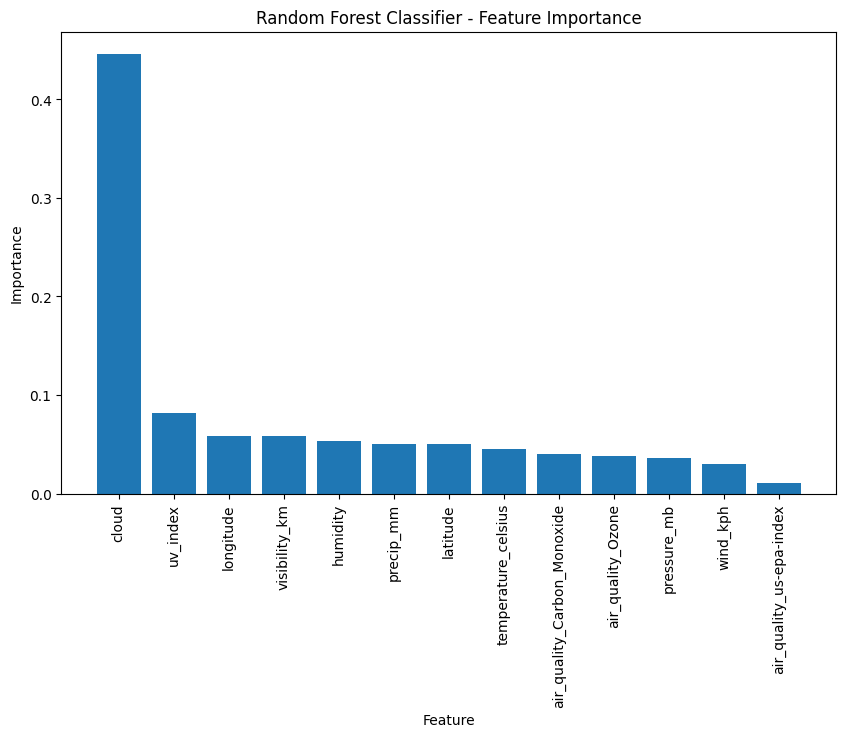

Test RMSE: 0.6758883918052054
Test MAE: 0.4866720747234111


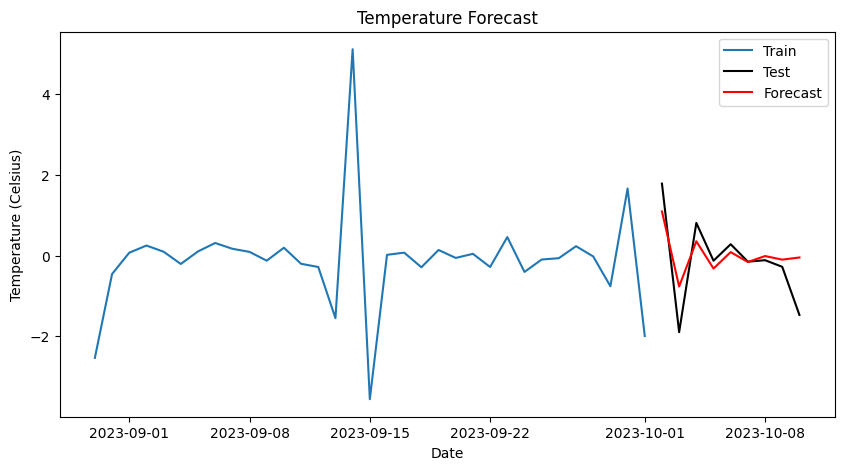

The accuracy of the SVM model on the test set is: 0.69


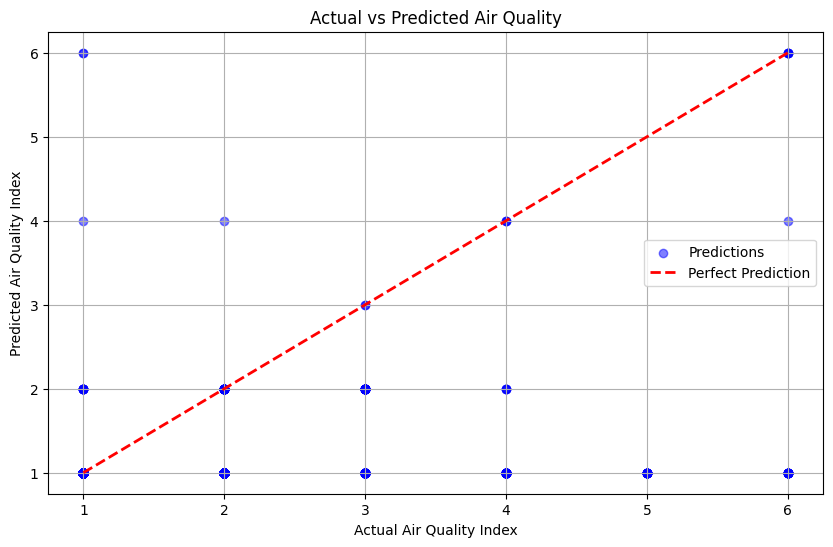

In [41]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, mean_squared_error, mean_absolute_error
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
from math import sqrt

# Load your dataset
df2 = pd.read_csv('GlobalWeatherRepository.csv')

# Random Forest Regression - Cloudy or Not Prediction
# Define features and target for classification
features_classification = df2[[
    'latitude', 'longitude', 'wind_kph', 'temperature_celsius', 'pressure_mb',
    'precip_mm', 'humidity', 'cloud', 'visibility_km', 'uv_index',
    'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_us-epa-index']]
target_classification = df2['condition_text']

# Split the data
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(
    features_classification, target_classification, test_size=0.2, random_state=42)

# Create and fit the model
rf_class_model = RandomForestClassifier(n_estimators=100)
rf_class_model.fit(X_train_class, y_train_class)

# Make predictions
predictions_class = rf_class_model.predict(X_test_class)

# Evaluate the model
accuracy_class = accuracy_score(y_test_class, predictions_class)
class_report_class = classification_report(y_test_class, predictions_class)

# Print the results
print(f'Accuracy (Random Forest Classification): {accuracy_class}')
print('Classification Report (Random Forest Classification):')
print(class_report_class)

# Feature importance visualization
feature_importance = rf_class_model.feature_importances_
feature_names = features_classification.columns
indices = np.argsort(feature_importance)[::-1]
plt.figure(figsize=(10, 6))
plt.bar(range(features_classification.shape[1]), feature_importance[indices])
plt.xticks(range(features_classification.shape[1]), feature_names[indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Random Forest Classifier - Feature Importance')
plt.show()

# Temperature Forecast using ARIMA
# Load and preprocess the dataset
data = df2.copy()
data['last_updated'] = pd.to_datetime(data['last_updated'])
data.set_index('last_updated', inplace=True)
daily_temperature = data['temperature_celsius'].resample('D').mean()
daily_temperature.dropna(inplace=True)

# Check for stationarity
adf_result = adfuller(daily_temperature)
if adf_result[1] > 0.05:
    daily_temperature = daily_temperature.diff().dropna()

# Split the data
train_size = int(len(daily_temperature) * 0.8)
train, test = daily_temperature[0:train_size], daily_temperature[train_size:]

# Fit the ARIMA model
model = ARIMA(train, order=(1, 1, 1))
model_fit = model.fit()

# Forecast
forecast = model_fit.forecast(steps=len(test))

# Evaluate the model
rmse = sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)

# Print results
print('Test RMSE:', rmse)
print('Test MAE:', mae)

# Plotting
plt.figure(figsize=(10, 5))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test', color='black')
plt.plot(test.index, forecast, label='Forecast', color='red')
plt.title('Temperature Forecast')
plt.xlabel('Date')
plt.ylabel('Temperature (Celsius)')
plt.legend()
plt.show()

# Air Quality Index Prediction using SVM
# Check and handle missing values
features = [
    'temperature_celsius', 
    'humidity', 
    'wind_kph', 
    'pressure_mb', 
    'precip_mm', 
    'cloud', 
    'visibility_km', 
    'uv_index', 
]

missing_data = df2[features].isnull().sum()
missing_data = missing_data[missing_data > 0]
if not missing_data.empty:
    for feature in missing_data.index:
        df2[feature].fillna(df2[feature].mean(), inplace=True)

# Prepare the data
X = df2[features]
y = df2['air_quality_us-epa-index']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize and train the SVM classifier
classifier = svm.SVC()
classifier.fit(X_train, y_train)

# Make predictions and evaluate the model
y_pred = classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'The accuracy of the SVM model on the test set is: {accuracy:.2f}')

# Plotting actual vs predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5, label='Predictions')
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--', lw=2, label='Perfect Prediction')
plt.title('Actual vs Predicted Air Quality')
plt.xlabel('Actual Air Quality Index')
plt.ylabel('Predicted Air Quality Index')
plt.legend()
plt.grid(True)
plt.show()
